# Preparacion de los datos

In [1]:
from lib.utilities import unpickle, tryDataset, mkfolders, os, compute_mixture, load_mixture

(50000, 32, 32, 3)


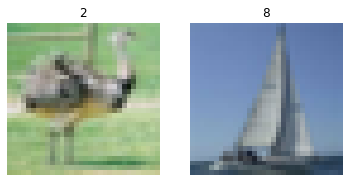

(10000, 32, 32, 3)


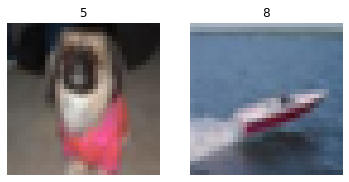

In [2]:
X_train = unpickle("Input\cifar-10-train")
X_test = unpickle("Input\cifar-10-test")
tryDataset(X_train)
tryDataset(X_test)

# Entrenamiento

## Persistencia

In [3]:
_raiz = "Resultados/CIFAR10pruebasAAE"
_nombre = "CIFAR10"

Creamos las carpetas para almacenar el output

In [4]:
mkfolders(_raiz, True)

Carpeta Resultados/CIFAR10pruebasAAE ya existe


## Entrenamiento en grid

Tamaño de la capa latente:

In [5]:
dim_latente_cand = [512, 1024]

Tamaño de las imagenes:

In [6]:
img_shape = X_train["data"][0].shape

Parametros:

In [7]:
from lib.discriminadores import *
from lib.genEJ import *
from keras import losses

In [8]:
discriminators = [(build_discriminator ,"default_disc", {}, {"truth":true_sampler, "truth_kwargs":{}, "falsehood":fake_sampler}),
                    (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":true_sampler_clases, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})]


ae_losses = [(losses.mean_squared_error, "ae_MSE_loss")]
disc_losses =[(losses.binary_crossentropy, "disc_binXentropy_loss")]

In [9]:
epochs = 12

In [10]:
from lib.compilado import assemble_AAE_twoPhased
from lib.entrenamiento import fit_AAE_twoPhased
from lib.convolucional import build_conv_decoder, build_conv_encoder
from lib.muestreo import show_prevResults, plot_history, sample_imgs, exploraLatente

In [11]:
def tryModel(
    model_name="MODEL", 
    assemble_AAE=assemble_AAE_twoPhased,
    loss_weights=[1, 1], 
    fit_AAE = fit_AAE_twoPhased,
    enc= (build_conv_encoder, "conv_enc", {}), 
    dec = (build_conv_decoder,"conv_dec", {}),
    ae_loss = (losses.mean_squared_error, "ae_MSE_loss"),
    disc = (build_discriminator_P ,"pyramid_disc", {}, {"truth":true_sampler, "truth_kwargs":{}, "falsehood":fake_sampler}),
    disc_loss = (losses.binary_crossentropy, "disc_binXentropy_loss"),
    dim_latente = 64,
    mixture_data=None,
    save=False
    ):
    # Carpeta donde almacenar los resultados
    ruta = _raiz+"\\"+model_name+"\\"+ae_loss[1]+"\\"+disc[1]+"\\"+disc_loss[1]+"\\"+str(dim_latente)
    # Si existen los modelos solo mostrar resultados guardados sin entrenar
    if os.path.isfile(ruta+"/Modelos\\decoder.h5") or os.path.isfile(ruta+"/Modelos\\autoencoder.h5"):
        print(ruta+" ya ha sido entrenada")
        show_prevResults(ruta, epochs=epochs)
        return
    # Crear carpeta
    mkfolders(ruta, True)
    # Intentar cargar datos de mixtura si se trata de un dsicriminador con informacion de clases
    fit_settings = disc[3]
    if "clases" in disc[2].keys() and mixture_data is not None:
        mixture = load_mixture(ruta="Data/", dataset_name=_nombre, expansion=10, **mixture_data)
        fit_settings["truth_kwargs"].update({"mixture":mixture})
    # Creacion de los modelos
    aae = assemble_AAE(dim_latente, img_shape, enc_model = enc[0], enc_kwargs=enc[2], dec_model = dec[0], dec_kwargs=dec[2], disc_model = disc[0], disc_kwargs=disc[2], ae_loss=ae_loss[0], disc_loss=disc_loss[0], loss_weights=loss_weights)
    # Entrenamiento
    history = fit_AAE(aae=aae, dim_latente=dim_latente, dataset=X_train, epochs = epochs, ruta = ruta, **fit_settings)
    # Obtenemos informacion del numero de clases para mostrar resultados, si no hay se intenta generar una mixtura para mas tarde
    clases=0
    if "clases" in disc[2].keys():
        clases=disc[2]["clases"]
    else:
        compute_mixture(X_train, aae[0], ruta="Data/", dataset_name=_nombre, **mixture_data)
    #Resultados
    print("Historia del entrenamiento:")
    plot_history(history, ruta=ruta, title=ruta)
    print("Imagenes regeneradas desde el set de entrenamiento (arriba originales):")
    sample_imgs(X_train, aae[3], epoch=epochs, nclases=clases, show=True, ruta=ruta, title=ruta+" regeneration", nombre="TRAINSET")
    print("Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):")
    sample_imgs(X_test, aae[3], epoch=epochs, nclases=clases, show=True, ruta=ruta, title=ruta+" regeneration", nombre="TESTSET")
    print("Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):")
    exploraLatente(aae[0], aae[1], "Input\cifar-10-groupedtrain", ruta=ruta, nombre="GenFromLatentTRAINSET")
    print("Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):")
    exploraLatente(aae[0], aae[1], "Input\cifar-10-groupedtest", ruta=ruta, nombre="GenFromLatentTESTSET")
    # Guardado de modelos
    if save:
        mkfolders(ruta+"/Modelos")
        aae[1].save(ruta+"/Modelos\\decoder.h5")
        aae[3].save(ruta+"/Modelos\\autoencoder.h5")


### Entrenamiento de AAE Convolucional - Base line

In [12]:
dim_latente = 512
model_name = "CONVOLUTIONAL"
loss_weigths = [0.999, 0.001]

Default

Layers for input 512 and output 1:
Layer 1: 64 neurons
Layer 2: 8 neurons
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\pyramid_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.247378, acc: 99.00%] AAE: [mse: 1.335747, b_ce: 0.057740] 48.95s		
E1 <██████████> 100% DISC: [loss: 42.285901, acc: 23.50%] AAE: [mse: 4.258147, b_ce: 0.057104] 37.26s		
E2 <██████████> 100% DISC: [loss: 0.051435, acc: 99.00%] AAE: [mse: 13.091800, b_ce: 0.047976] 36.76s		
E3 <██████████> 100% DISC: [loss: 0.328092, acc: 96.00%] AAE: [mse: 1.282755, b_ce: 0.051309] 36.25s		
E4 <██████████> 100% DISC: [loss: 79.486300, acc: 34.50%] AAE: [mse: 0.051773, b_ce: 0.051773] 37.00s		
E5 <██████████> 100% DISC: [loss: 8.764999, acc: 4.00%] AAE: [mse: 4.545317, b_ce: 0.056603] 36.95s			
E6 <██████████> 100% DISC: [loss: 0.021519, acc: 100.00%] AAE: [mse: 12.529527, b_ce: 0.040906] 36.95s		
E7 <██████████> 100% DISC: [loss: 0.040981, acc: 98.50%] AAE: [mse: 4.257666, b_ce: 0.053092] 36.95s		
E8 <██████████> 100% DISC: [loss: 39.915298, acc: 23.50%] AAE: [mse: 0.239249, b_ce: 0.038800] 37.02s		
E9 <██████████> 100% DISC: [loss: 0.799830, acc: 54.50%] AAE: [mse:

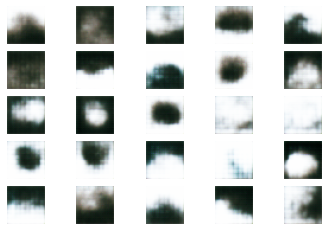

Historia del entrenamiento:


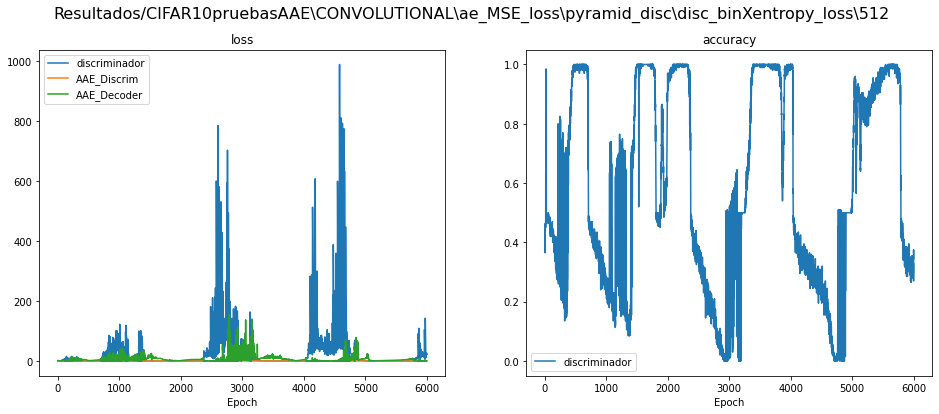

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


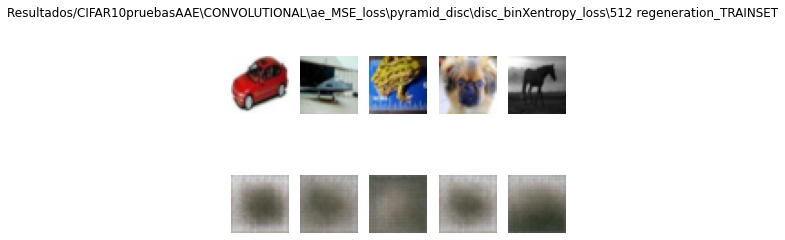

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


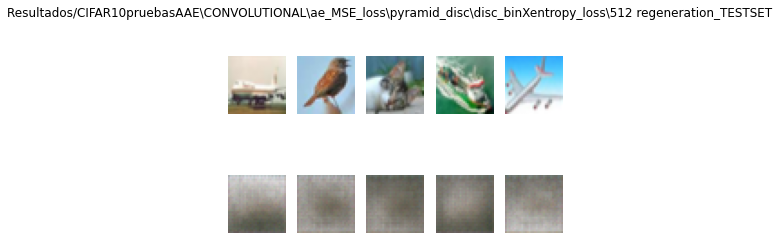

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


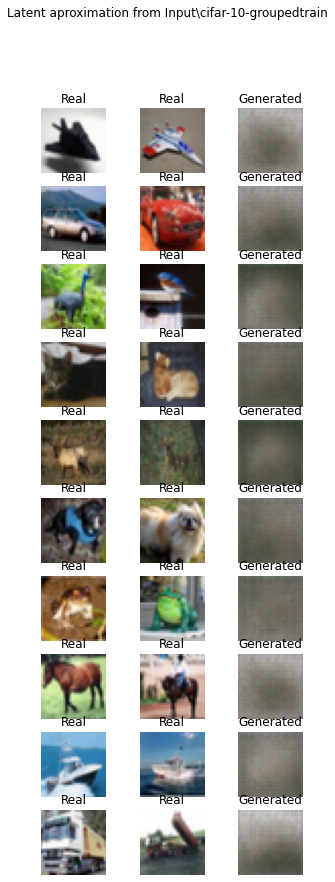

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


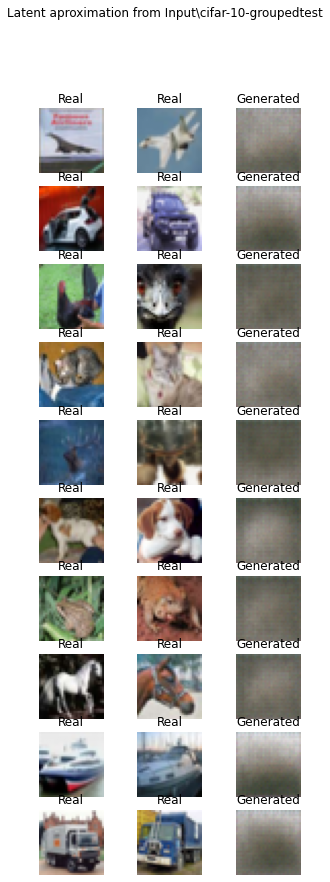

In [13]:
tryModel(dim_latente=dim_latente, model_name=model_name)

Default + lossweigths 99%

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\pyramid_disc\disc_binXentropy_loss\512 ya existe
Layers for input 512 and output 1:
Layer 1: 64 neurons
Layer 2: 8 neurons
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\pyramid_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.997640, acc: 47.50%] AAE: [mse: 0.020778, b_ce: 0.018962] 37.74s		
E1 <██████████> 100% DISC: [loss: 0.647992, acc: 61.00%] AAE: [mse: 0.017019, b_ce: 0.014670] 36.88s		
E2 <██████████> 100% DISC: [loss: 1.253745, acc: 50.00%] AAE: [mse: 0.013990, b_ce: 0.012454] 38.65s		
E3 <██████████> 100% DISC: [loss: 9.146799, acc: 33.50%] AAE: [mse: 0.013643, b_ce: 0.013318] 37.75s		
E4 <██████████> 100% DISC: [loss: 9.781200, acc: 32.50%] AAE: [mse: 0.010754, b_ce: 0.010731] 36.77s		
E5 <██████████> 100% DISC: [loss: 0.888132, acc: 62.50%] AAE: [mse: 0.014822, b_ce: 0.011797] 36.73s		
E6 <██████████> 100% DISC: [loss: 0.218756, acc: 95.50%] AAE: [mse: 0.012416, b_ce: 0.010265] 36.76s		
E7 <██████████> 100% DISC: [loss: 1.063711, acc: 34.00%] AAE: [mse: 0.011922, b_ce: 0.010426] 36.66s		
E8 <██████████> 100% DISC: [loss: 1.177583, acc: 21.00%] AAE: [mse: 0.010068, b_ce: 0.009034] 37.13s		
E9 <██████████> 100% DISC: [loss: 1.553309, acc: 12.50%] AAE: [mse: 0.010

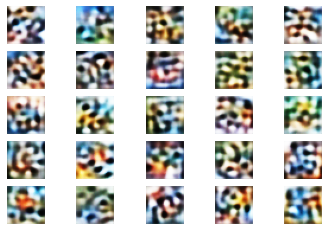

Historia del entrenamiento:


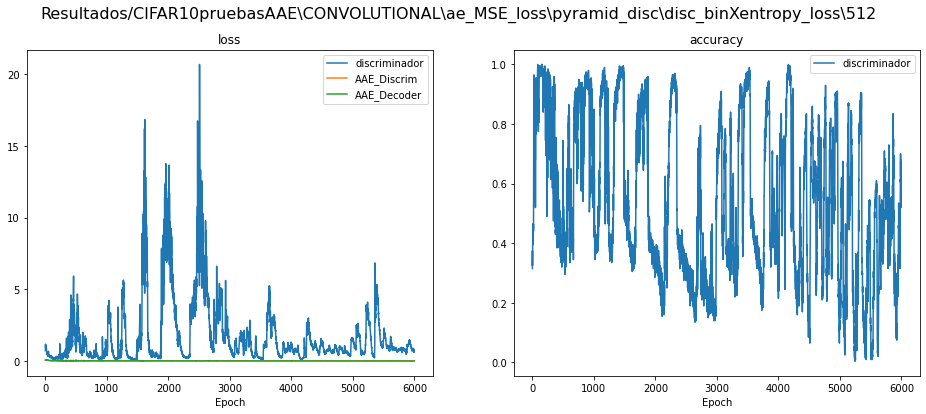

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


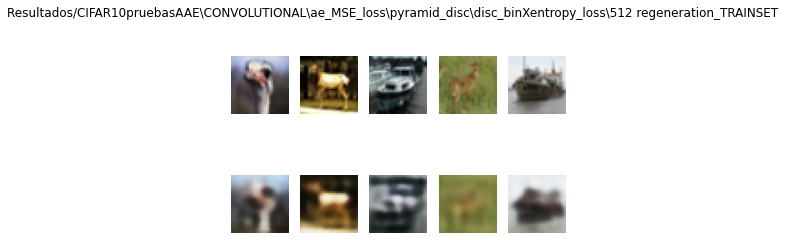

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


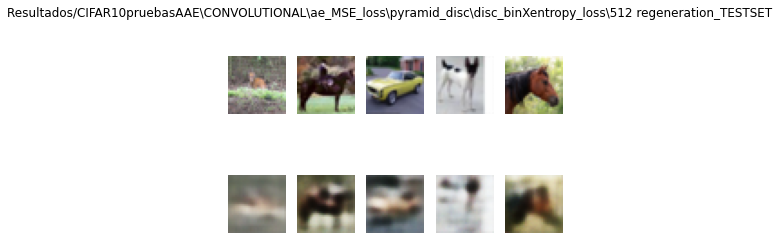

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


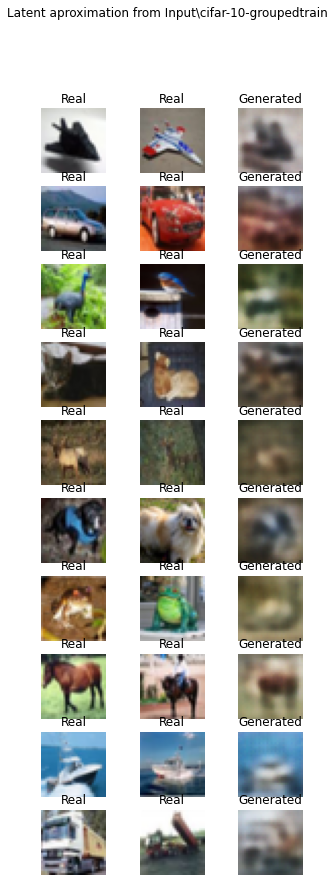

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


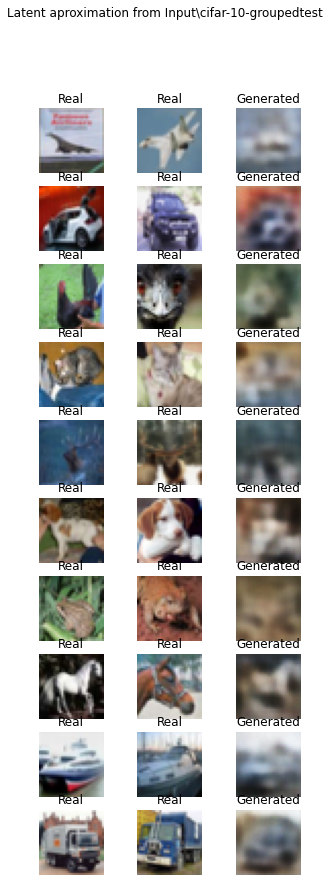

In [14]:
tryModel(loss_weights=loss_weigths, dim_latente=dim_latente, model_name=model_name)

Mismo loss weigth para decoder y discriminador - depth 4

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\pyramid_disc\disc_binXentropy_loss\512 ya existe
Layers for input 512 and output 1:
Layer 1: 108 neurons
Layer 2: 23 neurons
Layer 3: 5 neurons
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\pyramid_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.190601, acc: 100.00%] AAE: [mse: 1.275408, b_ce: 0.049179] 42.16s		
E1 <██████████> 100% DISC: [loss: 23.329599, acc: 6.50%] AAE: [mse: 14.210507, b_ce: 0.057874] 40.65s		
E2 <██████████> 100% DISC: [loss: 3.737367, acc: 49.00%] AAE: [mse: 5.188914, b_ce: 0.059427] 40.74s		
E3 <██████████> 100% DISC: [loss: 0.134347, acc: 98.50%] AAE: [mse: 4.083895, b_ce: 0.058743] 41.07s		
E4 <██████████> 100% DISC: [loss: 0.132020, acc: 98.50%] AAE: [mse: 2.913123, b_ce: 0.054314] 40.95s		
E5 <██████████> 100% DISC: [loss: 0.565297, acc: 70.50%] AAE: [mse: 2.485688, b_ce: 0.063329] 40.95s		
E6 <██████████> 100% DISC: [loss: 0.386367, acc: 81.50%] AAE: [mse: 2.916469, b_ce: 0.057668] 41.35s		
E7 <██████████> 100% DISC: [loss: 2.597545, acc: 50.00%] AAE: [mse: 2.538909, b_ce: 0.049808] 41.17s		
E8 <██████████> 100% DISC: [loss: 3.082327, acc: 50.00%] AAE: [mse: 2.331221, b_ce: 0.045363] 41.15s		
E9 <██████████> 100% DISC: [loss: 0.402182, acc: 84.50%] AAE: [mse: 2.0

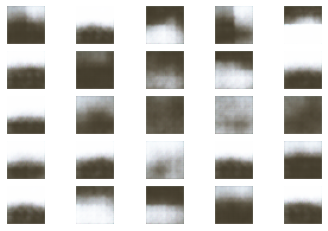

Historia del entrenamiento:


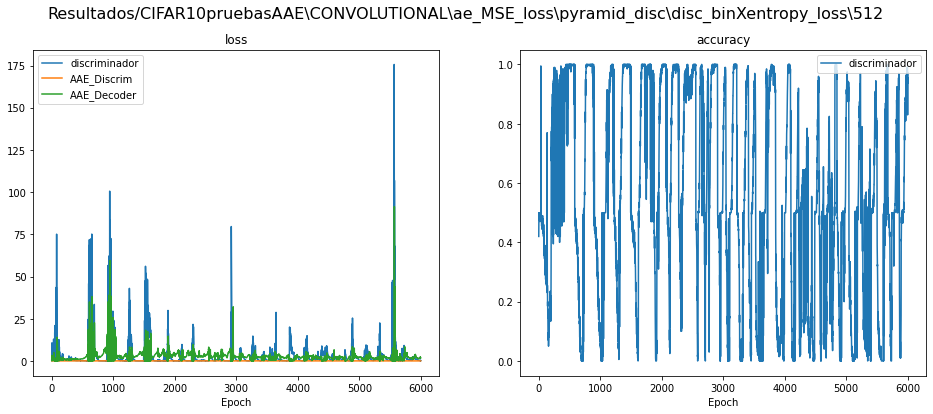

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


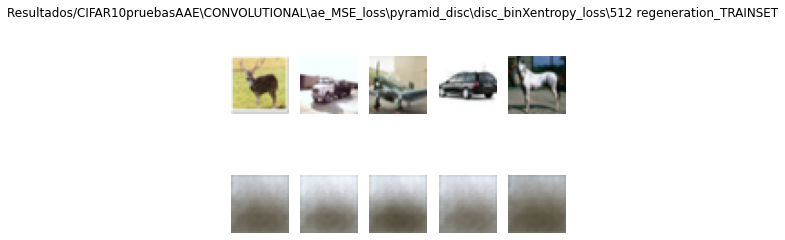

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


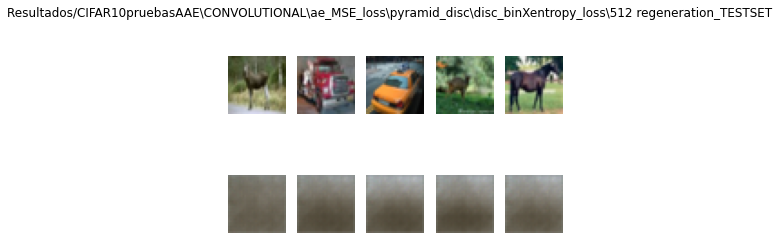

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


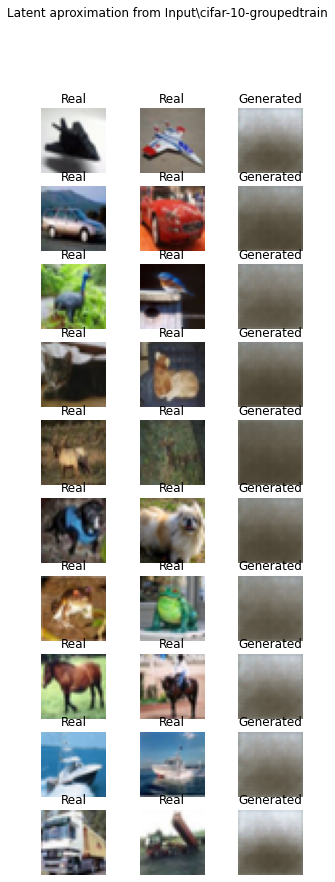

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


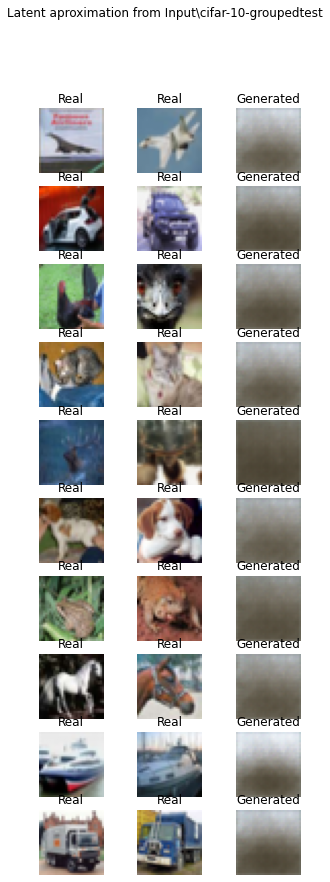

In [15]:
enc = (build_conv_encoder, "dense_enc",{"depth":4})
dec = (build_conv_decoder, "dense_dec",{"depth":4})
disc = (build_discriminator_P ,"pyramid_disc", {"depth":3}, {"truth":true_sampler, "truth_kwargs":{}, "falsehood":fake_sampler})
tryModel(enc=enc, dec=dec, disc=disc, dim_latente=dim_latente, model_name=model_name)


99.9% de lossweigth para el decoder - depth 4

Carpeta Resultados/CIFAR10pruebasAAE\DENSE\ae_MSE_loss\pyramid_disc\disc_binXentropy_loss\512 ya existe
Layers for input 512 and output 1:
Layer 1: 108 neurons
Layer 2: 23 neurons
Layer 3: 5 neurons
Entrenando: Resultados/CIFAR10pruebasAAE\DENSE\ae_MSE_loss\pyramid_disc\disc_binXentropy_loss\512
E0 <██████████> 100% DISC: [loss: 4.835939, acc: 36.50%] AAE: [mse: 0.038311, b_ce: 0.026958] 43.58s		
E1 <██████████> 100% DISC: [loss: 0.203347, acc: 92.50%] AAE: [mse: 0.029750, b_ce: 0.024676] 41.66s		
E2 <██████████> 100% DISC: [loss: 0.053228, acc: 99.00%] AAE: [mse: 0.030332, b_ce: 0.022421] 41.21s		
E3 <██████████> 100% DISC: [loss: 0.349990, acc: 85.50%] AAE: [mse: 0.025272, b_ce: 0.022188] 41.11s		
E4 <██████████> 100% DISC: [loss: 11.128986, acc: 19.50%] AAE: [mse: 0.020771, b_ce: 0.020152] 41.04s		
E5 <██████████> 100% DISC: [loss: 0.445087, acc: 87.50%] AAE: [mse: 0.027835, b_ce: 0.022886] 41.23s		
E6 <██████████> 100% DISC: [loss: 0.036727, acc: 98.50%] AAE: [mse: 0.024925, b_ce: 

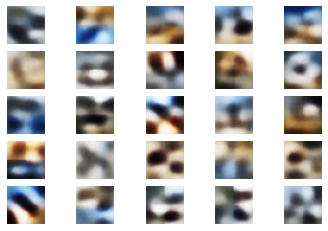

Historia del entrenamiento:


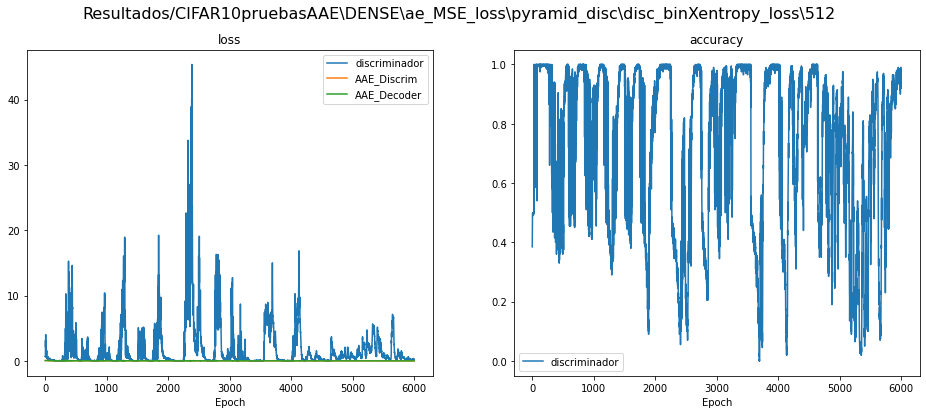

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


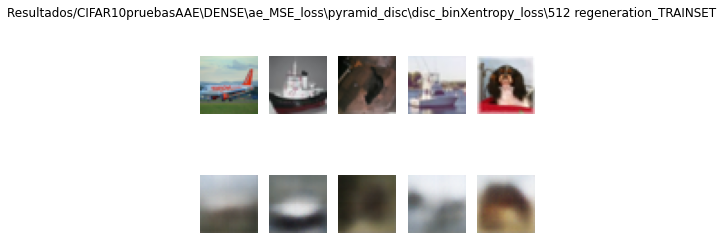

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


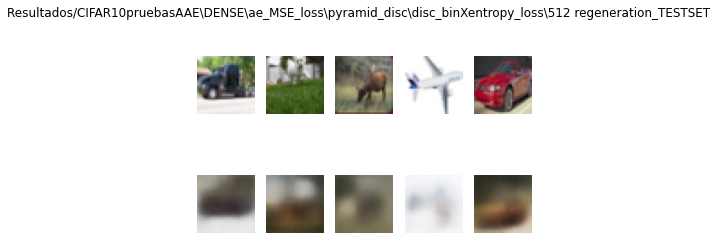

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


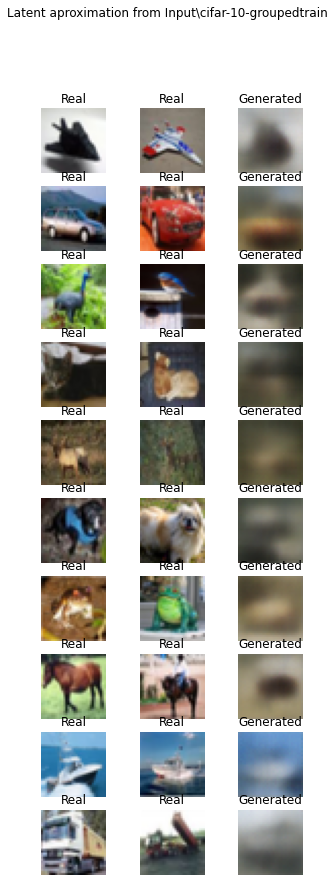

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


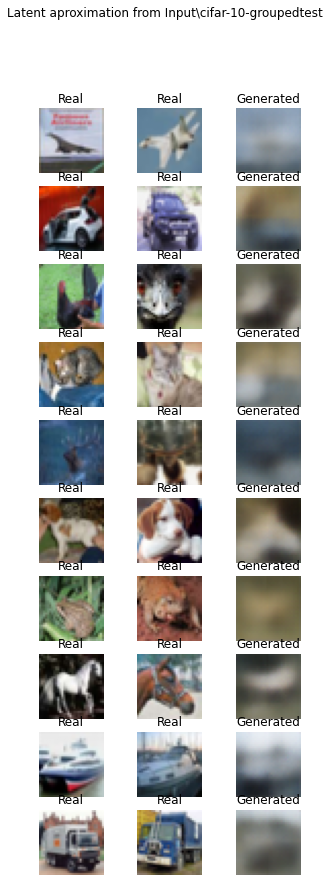

In [17]:
enc = (build_conv_encoder, "conv_enc",{"depth":4})
dec = (build_conv_decoder, "conv_dec",{"depth":4})
disc = (build_discriminator_P ,"pyramid_disc", {"depth":3}, {"truth":true_sampler, "truth_kwargs":{}, "falsehood":fake_sampler})
tryModel(loss_weights=loss_weigths, enc=enc, dec=dec, disc=disc, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":False, "nombre":str(dim_latente)+"cluster"})


128 filters, depth 4 loss_Weight 1:1

Carpeta Resultados/CIFAR10pruebasAAE\DENSE\ae_MSE_loss\pyramid_disc\disc_binXentropy_loss\512 ya existe
Layers for input 512 and output 1:
Layer 1: 108 neurons
Layer 2: 23 neurons
Layer 3: 5 neurons
Entrenando: Resultados/CIFAR10pruebasAAE\DENSE\ae_MSE_loss\pyramid_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.608571, acc: 90.50%] AAE: [mse: 0.959058, b_ce: 0.057076] 78.89s		
E1 <██████████> 100% DISC: [loss: 2.120636, acc: 0.00%] AAE: [mse: 1.429097, b_ce: 0.059825] 76.01s		
E2 <██████████> 100% DISC: [loss: 0.863853, acc: 49.00%] AAE: [mse: 0.997634, b_ce: 0.056627] 75.87s		
E3 <██████████> 100% DISC: [loss: 0.773197, acc: 10.00%] AAE: [mse: 0.878858, b_ce: 0.053361] 75.95s		
E4 <██████████> 100% DISC: [loss: 0.862291, acc: 5.00%] AAE: [mse: 0.925217, b_ce: 0.109590] 76.15s		
E5 <██████████> 100% DISC: [loss: 1.001693, acc: 8.50%] AAE: [mse: 0.978589, b_ce: 0.061143] 75.85s		
E6 <██████████> 100% DISC: [loss: 1.586698, acc: 0.00%] AAE: [mse: 0.959729, b_ce: 0.059856] 75.74s		
E7 <██████████> 100% DISC: [loss: 0.671730, acc: 73.00%] AAE: [mse: 1.033844, b_ce: 0.049503] 76.03s		
E8 <██████████> 100% DISC: [loss: 0.875918, acc: 6.00%] AAE: [mse: 0.836768, b_ce: 0.051370] 76.81s		
E9 <██████████> 100% DISC: [loss: 0.407611, acc: 98.00%] AAE: [mse: 0.961102, 

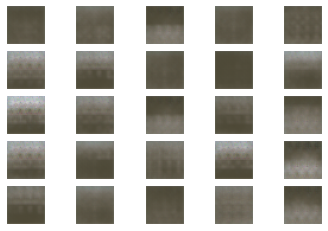

Historia del entrenamiento:


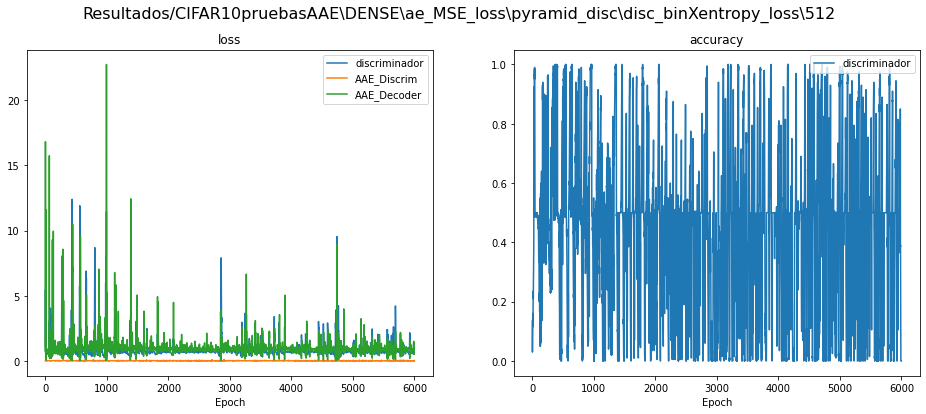

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


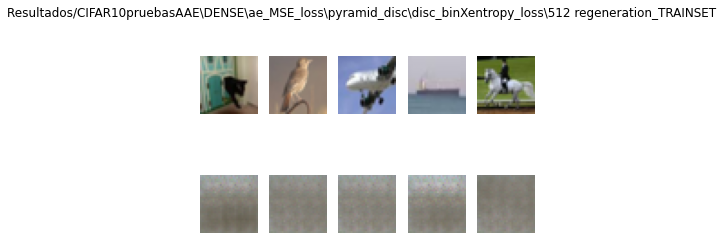

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


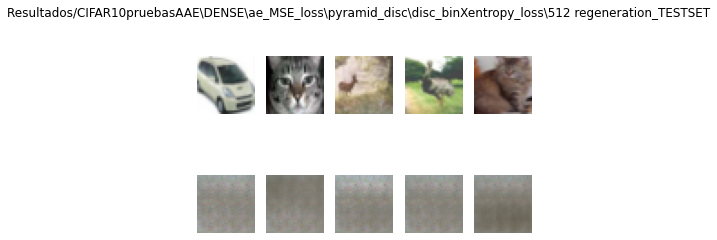

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


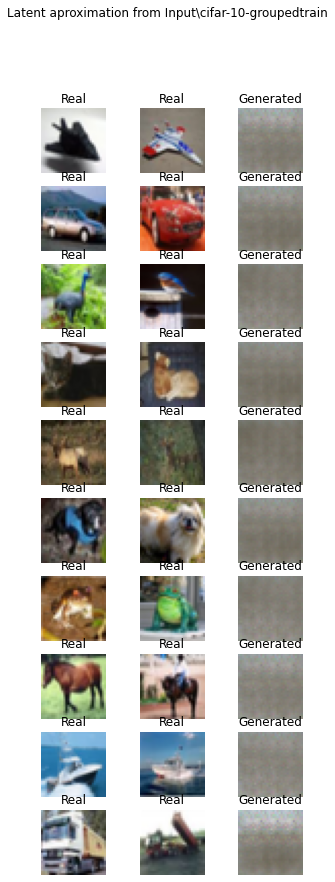

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


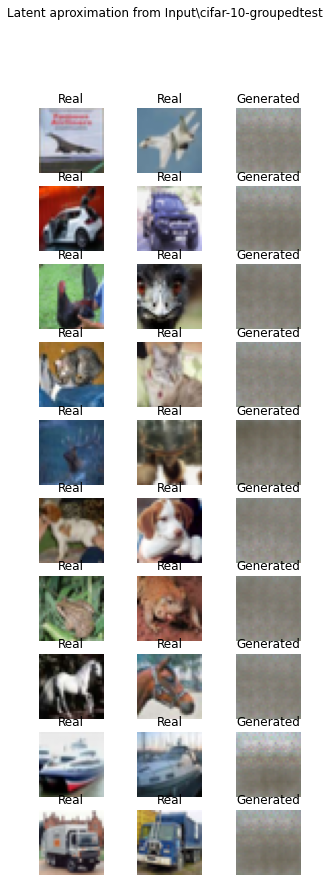

In [18]:
enc = (build_conv_encoder, "conv_enc",{"depth":4, "filter":128})
dec = (build_conv_decoder, "conv_dec",{"depth":4, "filter":128})
disc = (build_discriminator_P ,"pyramid_disc", {"depth":3}, {"truth":true_sampler, "truth_kwargs":{}, "falsehood":fake_sampler})
tryModel(enc=enc, dec=dec, disc=disc, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":False, "nombre":str(dim_latente)+"cluster"})


128 filters, depth 4 loss_Weight 99.9%

Carpeta Resultados/CIFAR10pruebasAAE\DENSE\ae_MSE_loss\pyramid_disc\disc_binXentropy_loss\512 ya existe
Layers for input 512 and output 1:
Layer 1: 108 neurons
Layer 2: 23 neurons
Layer 3: 5 neurons
Entrenando: Resultados/CIFAR10pruebasAAE\DENSE\ae_MSE_loss\pyramid_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.475351, acc: 79.50%] AAE: [mse: 0.038810, b_ce: 0.035965] 76.80s		
E1 <██████████> 100% DISC: [loss: 0.235118, acc: 92.50%] AAE: [mse: 0.031180, b_ce: 0.027084] 75.92s		
E2 <██████████> 100% DISC: [loss: 0.188925, acc: 94.50%] AAE: [mse: 0.026910, b_ce: 0.023826] 75.77s		
E3 <██████████> 100% DISC: [loss: 2.541224, acc: 27.50%] AAE: [mse: 0.042834, b_ce: 0.040355] 75.28s		
E4 <██████████> 100% DISC: [loss: 0.605355, acc: 70.50%] AAE: [mse: 0.023389, b_ce: 0.020045] 74.14s		
E5 <██████████> 100% DISC: [loss: 1.896908, acc: 28.50%] AAE: [mse: 0.023644, b_ce: 0.022783] 74.51s		
E6 <██████████> 100% DISC: [loss: 0.108778, acc: 97.50%] AAE: [mse: 0.023934, b_ce: 0.019856] 74.43s		
E7 <██████████> 100% DISC: [loss: 2.697214, acc: 19.00%] AAE: [mse: 0.026416, b_ce: 0.022077] 74.23s		
E8 <██████████> 100% DISC: [loss: 3.164922, acc: 15.50%] AAE: [mse: 0.024691, b_ce: 0.021893] 73.93s		
E9 <██████████> 100% DISC: [loss: 0.216267, acc: 95.50%] AAE: [mse: 0.021

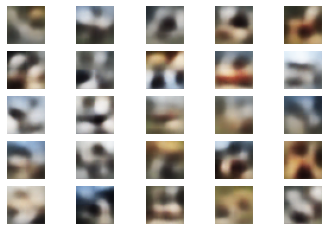

Historia del entrenamiento:


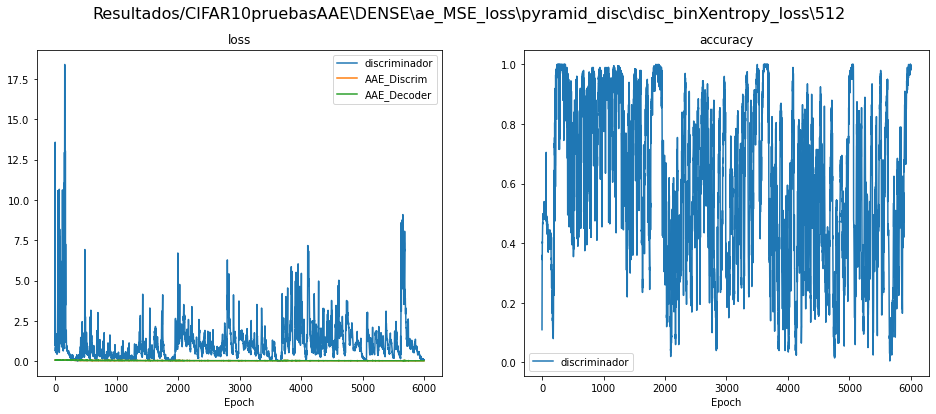

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


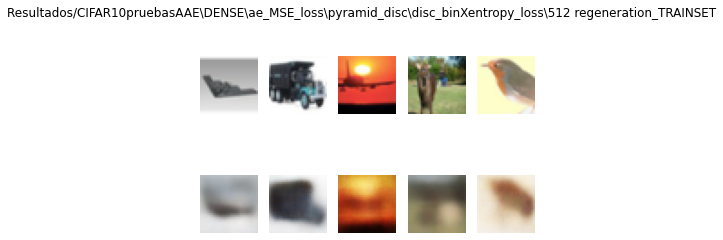

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


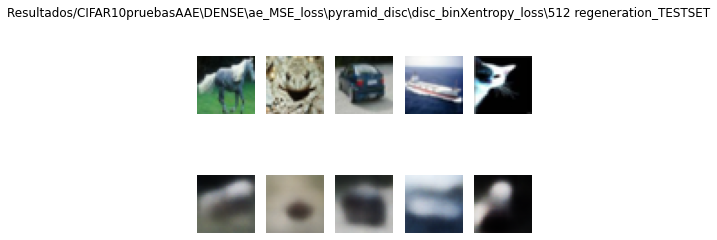

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


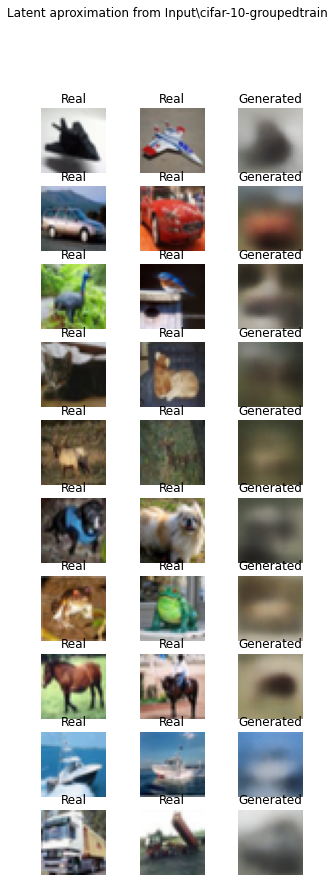

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


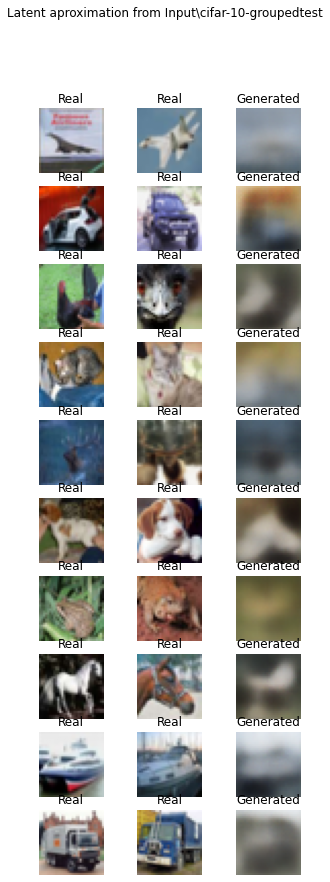

In [19]:
enc = (build_conv_encoder, "conv_enc",{"depth":4, "filter":128})
dec = (build_conv_decoder, "conv_dec",{"depth":4, "filter":128})
disc = (build_discriminator_P ,"pyramid_disc", {"depth":3}, {"truth":true_sampler, "truth_kwargs":{}, "falsehood":fake_sampler})
tryModel(loss_weights=loss_weigths, enc=enc, dec=dec, disc=disc, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":False, "nombre":str(dim_latente)+"cluster"})


Con clases - Sin Pesos. Hiperparametros por defecto (tuvieron los mejores resultados en las pruebas anteriores)

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\class_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\class_disc\disc_binXentropy_loss\512
E0 <██████████> 100% DISC: [loss: 0.352793, acc: 95.00%] AAE: [mse: 3.071175, b_ce: 0.030820] 123.86s		
E1 <██████████> 100% DISC: [loss: 0.224664, acc: 95.00%] AAE: [mse: 5.320969, b_ce: 0.021516] 117.38s		
E2 <██████████> 100% DISC: [loss: 0.141755, acc: 95.00%] AAE: [mse: 6.676705, b_ce: 0.037539] 118.03s		
E3 <██████████> 100% DISC: [loss: 0.030780, acc: 100.00%] AAE: [mse: 6.293658, b_ce: 0.022202] 117.29s		
E4 <██████████> 100% DISC: [loss: 0.115760, acc: 95.00%] AAE: [mse: 3.748537, b_ce: 0.027700] 117.38s		
E5 <██████████> 100% DISC: [loss: 0.163063, acc: 95.00%] AAE: [mse: 3.717842, b_ce: 0.028440] 117.53s		
E6 <██████████> 100% DISC: [loss: 0.166770, acc: 95.00%] AAE: [mse: 4.647214, b_ce: 0.034855] 118.84s		
E7 <██████████> 100% DISC: [loss: 0.239789, acc: 95.00%] 

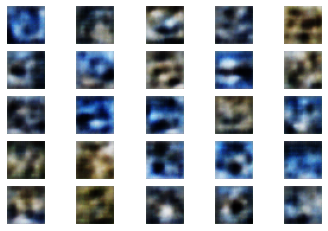

Historia del entrenamiento:


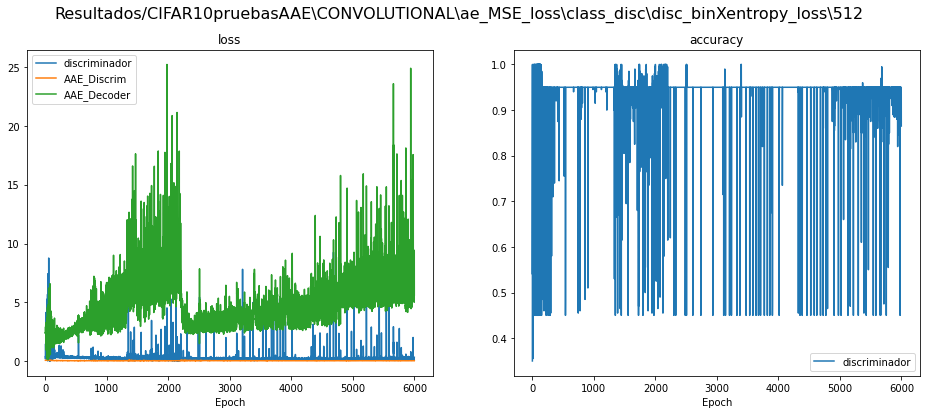

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


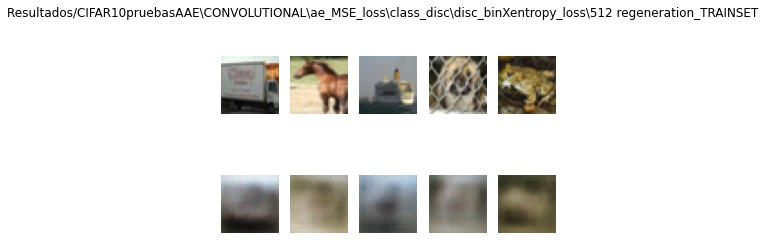

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


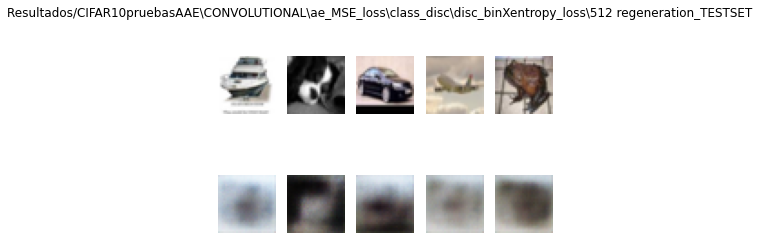

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


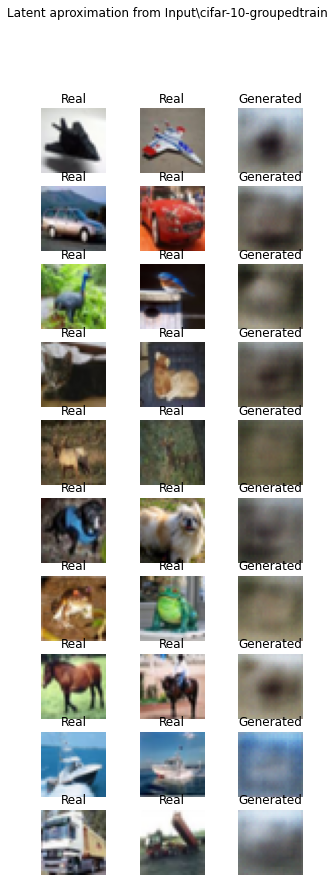

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


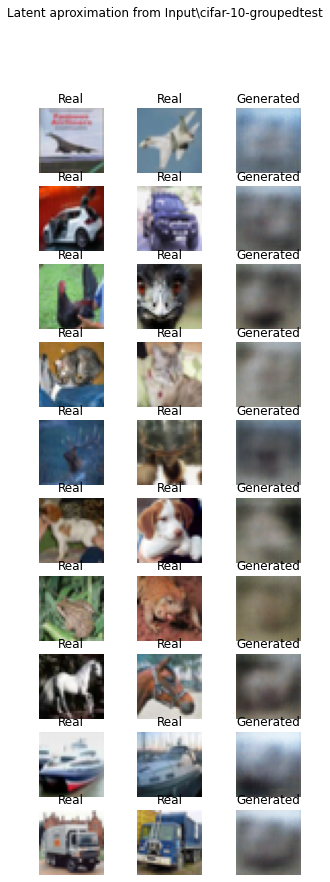

In [13]:
disc = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":true_multivariate_sampler_tf, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
tryModel(disc=disc, dim_latente=dim_latente, model_name=model_name)

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\class_disc\disc_binXentropy_loss\512 ya existe
Layers for input 522 and output 1:
Layer 1: 65 neurons
Layer 2: 8 neurons
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\class_disc\disc_binXentropy_loss\512
E0 <██████████> 100% DISC: [loss: 3.800566, acc: 51.50%] AAE: [mse: 35.254360, b_ce: 0.055237] 124.95s		
E1 <██████████> 100% DISC: [loss: 1.767869, acc: 53.50%] AAE: [mse: 25.827156, b_ce: 0.048264] 113.68s		
E2 <██████████> 100% DISC: [loss: 0.140958, acc: 94.50%] AAE: [mse: 11.768452, b_ce: 0.048537] 114.69s		
E3 <██████████> 100% DISC: [loss: 0.014233, acc: 100.00%] AAE: [mse: 6.584616, b_ce: 0.043422] 112.52s		
E4 <██████████> 100% DISC: [loss: 0.001161, acc: 100.00%] AAE: [mse: 7.944109, b_ce: 0.047017] 113.38s		
E5 <██████████> 100% DISC: [loss: 14.937483, acc: 46.50%] AAE: [mse: 29.375595, b_ce: 0.050522] 112.48s		
E6 <██████████> 100% DISC: [loss: 0.000001, acc: 100.00%] AAE: [mse: 25.390589, b

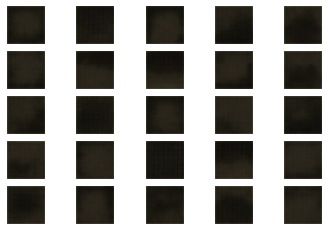

Historia del entrenamiento:


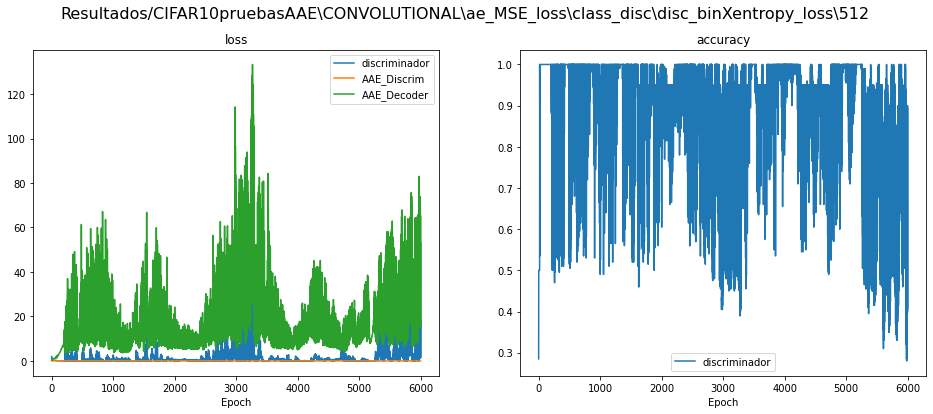

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


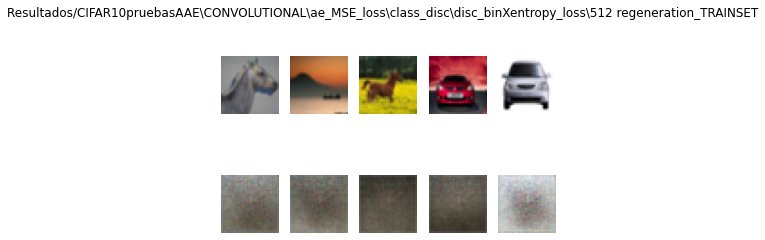

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


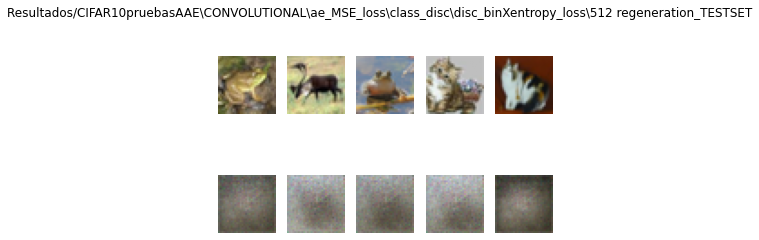

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


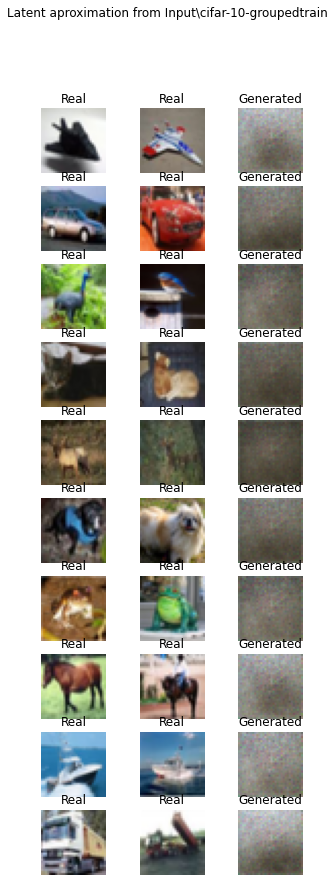

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


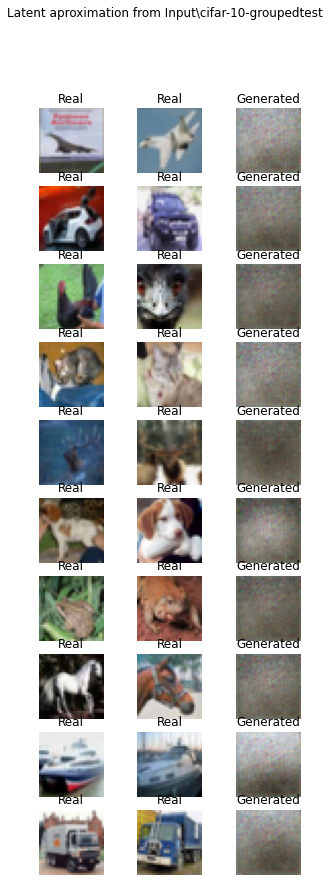

In [13]:
disc = (build_class_discriminator_P ,"class_disc",{"clases":10}, {"truth":true_multivariate_sampler_tf, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
tryModel(disc=disc, dim_latente=dim_latente, model_name=model_name)

Con clases - Con Pesos. Hiperparametros por defecto (tuvieron los mejores resultados en las pruebas anteriores)

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\class_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\class_disc\disc_binXentropy_loss\512
E0 <██████████> 100% DISC: [loss: 0.003040, acc: 100.00%] AAE: [mse: 0.019688, b_ce: 0.013827] 124.25s		
E1 <██████████> 100% DISC: [loss: 0.014997, acc: 100.00%] AAE: [mse: 0.016059, b_ce: 0.011750] 117.00s		
E2 <██████████> 100% DISC: [loss: 0.089276, acc: 96.00%] AAE: [mse: 0.016445, b_ce: 0.011279] 117.61s		
E3 <██████████> 100% DISC: [loss: 0.134983, acc: 94.50%] AAE: [mse: 0.015333, b_ce: 0.010126] 116.88s		
E4 <██████████> 100% DISC: [loss: 0.111844, acc: 96.50%] AAE: [mse: 0.017944, b_ce: 0.007671] 116.68s		
E5 <██████████> 100% DISC: [loss: 0.291219, acc: 95.00%] AAE: [mse: 0.014905, b_ce: 0.008626] 116.91s		
E6 <██████████> 100% DISC: [loss: 0.527364, acc: 73.50%] AAE: [mse: 0.024574, b_ce: 0.009548] 117.24s		
E7 <██████████> 100% DISC: [loss: 0.268634, acc: 87.50%]

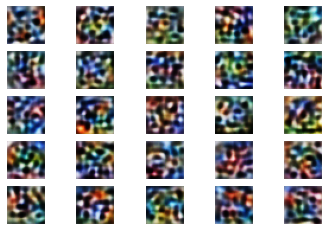

Historia del entrenamiento:


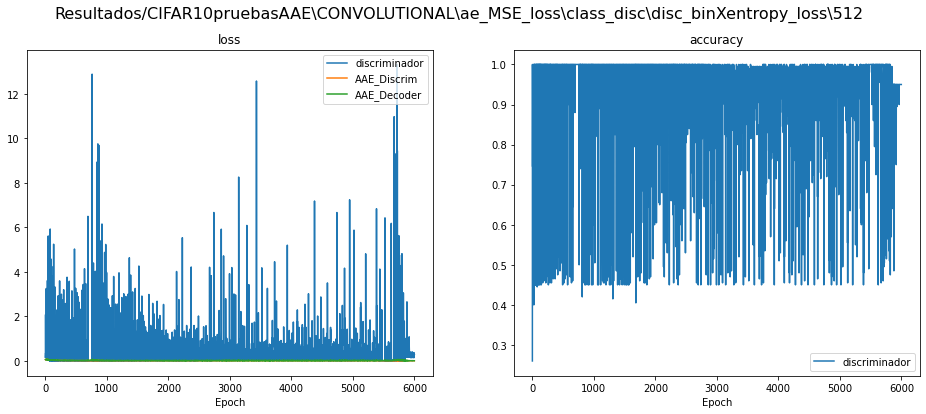

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


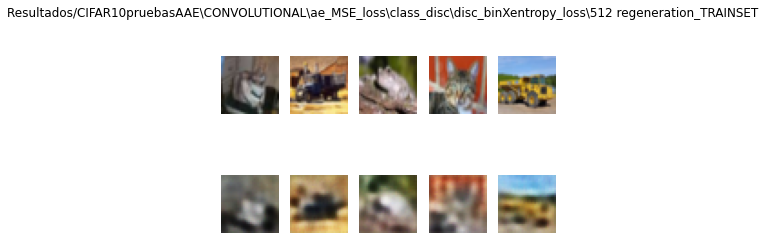

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


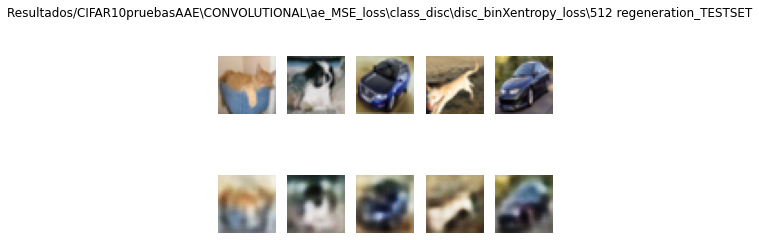

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


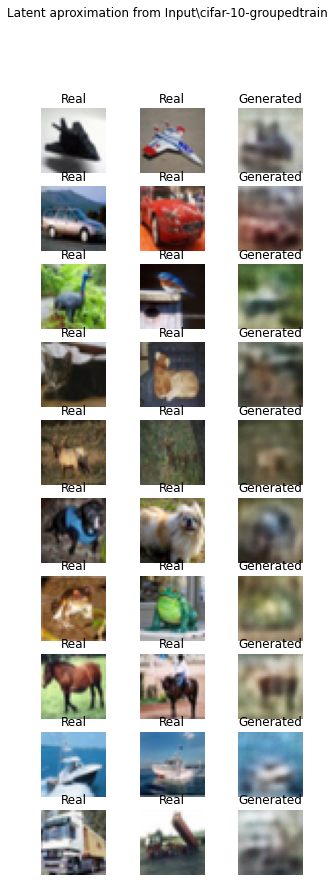

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


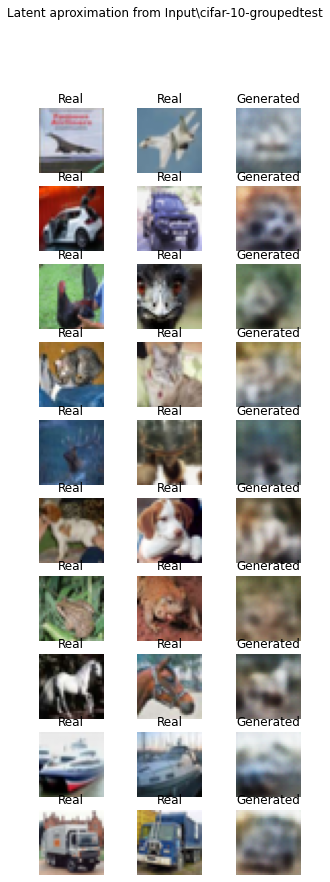

In [13]:
disc = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":true_multivariate_sampler_tf, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
tryModel(loss_weights=loss_weigths, disc=disc, dim_latente=dim_latente, model_name=model_name)

Layers for input 522 and output 1:
Layer 1: 65 neurons
Layer 2: 8 neurons
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\class_disc_P\disc_binXentropy_loss\512
E0 <██████████> 100% DISC: [loss: 0.425451, acc: 70.50%] AAE: [mse: 0.041583, b_ce: 0.018737] 117.40s		
E1 <██████████> 100% DISC: [loss: 0.615238, acc: 95.00%] AAE: [mse: 0.021761, b_ce: 0.016029] 116.43s		
E2 <██████████> 100% DISC: [loss: 0.316343, acc: 88.00%] AAE: [mse: 0.023657, b_ce: 0.014006] 116.36s		
E3 <██████████> 100% DISC: [loss: 0.109871, acc: 94.50%] AAE: [mse: 0.018682, b_ce: 0.013508] 116.48s		
E4 <██████████> 100% DISC: [loss: 0.152985, acc: 94.50%] AAE: [mse: 0.021464, b_ce: 0.016280] 116.57s		
E5 <██████████> 100% DISC: [loss: 0.222880, acc: 93.50%] AAE: [mse: 0.022031, b_ce: 0.013167] 117.74s		
E6 <██████████> 100% DISC: [loss: 0.058501, acc: 98.50%] AAE: [mse: 0.019062, b_ce: 0.010693] 117.26s		
E7 <██████████> 100% DISC: [loss: 0.198713, acc: 90.00%] AAE: [mse: 0.022244, b_ce: 0.010133

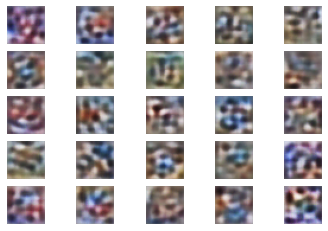

Historia del entrenamiento:


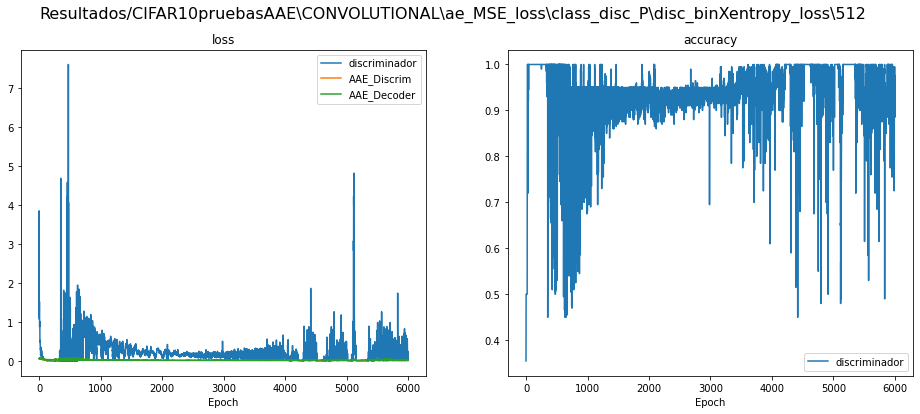

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


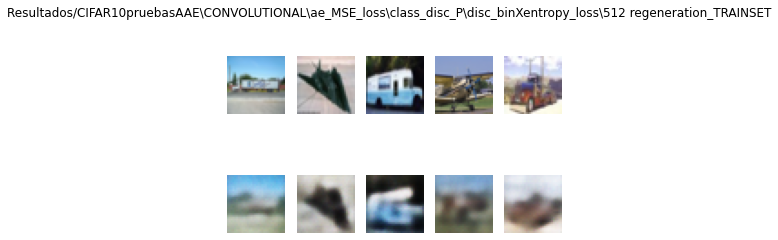

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


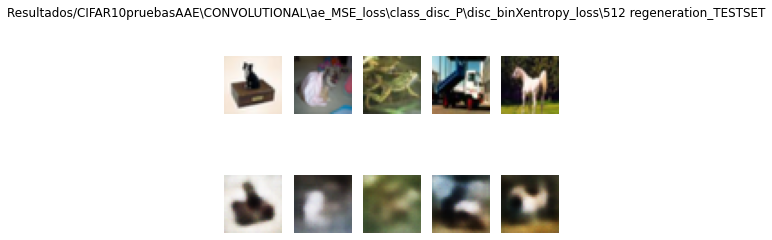

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


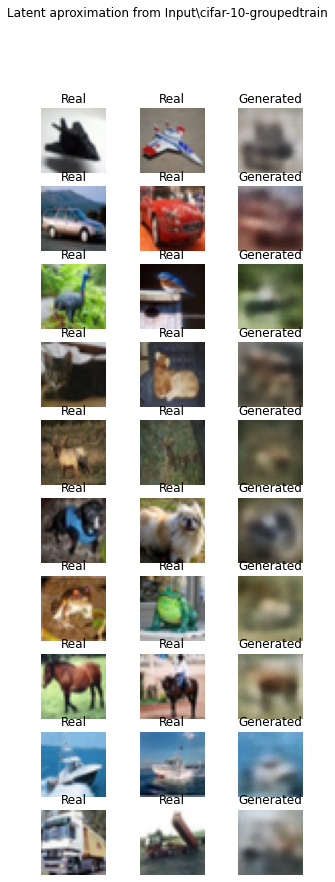

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


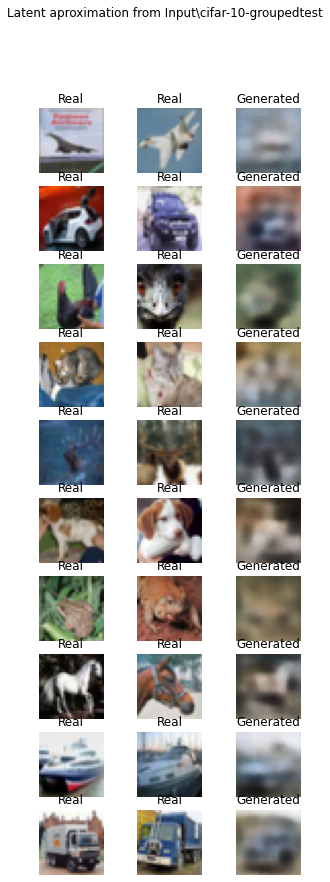

In [14]:
disc = (build_class_discriminator_P ,"class_disc_P",{"clases":10}, {"truth":true_multivariate_sampler_tf, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
tryModel(loss_weights=loss_weigths, disc=disc, dim_latente=dim_latente, model_name=model_name)